# Formula 1 World Championship (1950 - 2022) | A visual through the years

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#
# Larger scale for plots in notebooks
sns.set_context('notebook')
#
# Enable multiple cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'last_expr'
pd.set_option('display.max_colwidth', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
plt.rcParams['figure.figsize'] =(16,8)
#
# Setting seed for entire notebook
SEED = 42
np.random.seed(SEED)

## Load Datasets
- Dataset source: [Kaggle Formula 1 World Championship (1950 - 2022)](https://www.kaggle.com/datasets/rohanrao/formula-1-world-championship-1950-2020)
- cc: http://ergast.com/mrd/

In [2]:
circuits = pd.read_csv("datasets/circuits.csv")

constructors = pd.read_csv("datasets/constructors.csv")
constructor_results = pd.read_csv("datasets/constructor_results.csv")
constructor_standings = pd.read_csv("datasets/constructor_standings.csv")

drivers = pd.read_csv("datasets/drivers.csv")
driver_standings = pd.read_csv("datasets/driver_standings.csv")

lap_times = pd.read_csv("datasets/lap_times.csv")
pit_stops = pd.read_csv("datasets/pit_stops.csv")

quali = pd.read_csv("datasets/qualifying.csv")

races = pd.read_csv("datasets/races.csv")
# dropping Free Practice columns from races df
races.drop(
    list(races.loc[:, races.columns.str.startswith("fp")].columns), axis=1, inplace=True
)

results = pd.read_csv("datasets/results.csv")
sprint_results = pd.read_csv("datasets/sprint_results.csv")

seasons = pd.read_csv("datasets/seasons.csv")

status = pd.read_csv("datasets/status.csv")


In [20]:
races["date"] = pd.to_datetime(races["date"])
drivers["dob"] = pd.to_datetime(drivers["dob"])

driver_standings.sort_values(["wins", "raceId"], ascending=False)


driver_names = drivers[["driverId"]]
driver_names["name"] = drivers[['forename','surname']].apply(' '.join, axis=1)

driver_standings_with_names = driver_standings.merge(
    driver_names, on="driverId"
).sort_values(["raceId", "position"], ascending=[False, True])

# Add seasons column to driver standings so as to group by season and get highest points scored by each driver
driver_standings_with_names = driver_standings_with_names.merge(
    races[["year", "raceId"]], on="raceId", how="left"
)

seasons = seasons.merge(
    races.groupby("year")["raceId"].apply(list).reset_index(), on="year", how="left"
).rename(columns={"raceId": "races_raceId"})


C:\Users\Raymomd\AppData\Local\Temp\ipykernel_5300\1414164793.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  driver_names["name"] = drivers[['forename','surname']].apply(' '.join, axis=1)


### Explore datasets

The goal here is to get total points, and wins scored by drivers in their careers.
Races won by drivers is better metric to compare drivers across across different eras. This is because F1's scoring system has undergone changes over time hence some drivers have more points than others despite having won less races.

In [21]:
driver_wins = (
    driver_standings_with_names.pivot_table(
        index=["year", "driverId", "name"],
        values=["points", "wins"],
        fill_value=0,
        aggfunc=np.max,
    )
    .groupby(["driverId", "name"])[["points", "wins"]]
    .sum()
    .reset_index()
    .sort_values(["wins", "points"], ascending=[False, False])
).set_index("driverId")


driver_wins.head(10)
# driver_wins[driver_wins['surname']=='Schumacher']
most_vis_circuits = (
    races["name"]
    .value_counts()
    .reset_index()
    .rename(columns={"index": "grand_prix", "name": "number_of_GP"})
)
len(circuits["name"].unique())
type(most_vis_circuits)
most_vis_circuits.head()


,grand_prix,number_of_GP
0,British Grand Prix,73
1,Italian Grand Prix,73
2,Monaco Grand Prix,68
3,Belgian Grand Prix,67
4,German Grand Prix,64


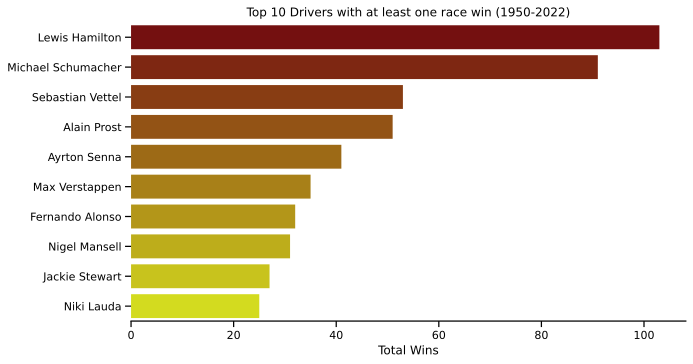

In [22]:
won_atleast_1 = driver_wins[driver_wins["wins"] >= 1][:10]
len_winners = len(won_atleast_1)
palette = sns.color_palette("blend:#840000,#F0FA00", len_winners)
g = sns.catplot(
    data=won_atleast_1,
    x="wins",
    y="name",
    kind="bar",
    aspect=2,
    palette=palette,
).set(
    title=f"Top {len_winners} Drivers with at least one race win (1950-2022)",
    xlabel="Total Wins",
    ylabel=None,
)

g.despine(left=True)


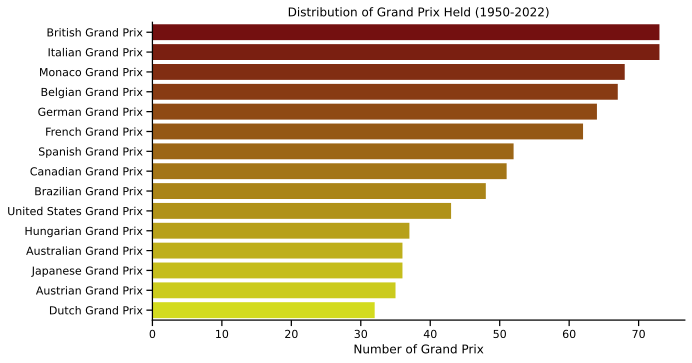

In [23]:
# palette=['#d0fefe','#840000']
grand_prix_subset = most_vis_circuits[most_vis_circuits["number_of_GP"] >= 30]
grid_length = len(grand_prix_subset)
palette = sns.color_palette("blend:#840000,#F0FA00", grid_length)
g = sns.catplot(
    data=grand_prix_subset,
    x="number_of_GP",
    y="grand_prix",
    kind="bar",
    aspect=2,
    palette=palette,
).set(
    title="Distribution of Grand Prix Held (1950-2022)",
    xlabel="Number of Grand Prix",
    ylabel=None,
)

# g.fig.suptitle("Distribution of Grand Prix Held (1950-2022)")


### Analyzing the decades

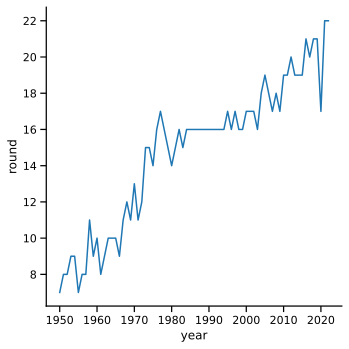

In [24]:
races["decade"] = (np.floor(races["year"] * 0.1) * 10).astype(np.int64)
race_increment = races.pivot_table(
    index=["decade", "year"], values="round", aggfunc="count"
)
sns.relplot(race_increment, x="year", y="round", kind="line")


In [25]:
list(races.loc[:, races.columns.str.startswith("fp")].columns)


[]

In [26]:
races_with_circuits = races.drop(
    ["time", "url", "quali_date", "quali_time", "sprint_date", "sprint_time"], axis=1
).sort_values(by=["year", "round"])
races_with_circuits = races_with_circuits.merge(
    circuits.drop(["circuitRef", "url"], axis=1),
    on="circuitId",
    how="left",
    suffixes=(None, "_circuit"),
)
races_with_circuits.set_index("date")


,raceId,year,round,circuitId,name,decade,name_circuit,location,country,lat,lng,alt
date,,,,,,,,,,,,
1950-05-13,833,1950,1,9,British Grand Prix,1950,Silverstone Circuit,Silverstone,UK,52.0786,-1.01694,153
1950-05-21,834,1950,2,6,Monaco Grand Prix,1950,Circuit de Monaco,Monte-Carlo,Monaco,43.7347,7.42056,7
1950-05-30,835,1950,3,19,Indianapolis 500,1950,Indianapolis Motor Speedway,Indianapolis,USA,39.7950,-86.23470,223
1950-06-04,836,1950,4,66,Swiss Grand Prix,1950,Circuit Bremgarten,Bern,Switzerland,46.9589,7.40194,551
1950-06-18,837,1950,5,13,Belgian Grand Prix,1950,Circuit de Spa-Francorchamps,Spa,Belgium,50.4372,5.97139,401
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-09,1092,2022,18,22,Japanese Grand Prix,2020,Suzuka Circuit,Suzuka,Japan,34.8431,136.54100,45
2022-10-23,1093,2022,19,69,United States Grand Prix,2020,Circuit of the Americas,Austin,USA,30.1328,-97.64110,161
2022-10-30,1094,2022,20,32,Mexico City Grand Prix,2020,Autódromo Hermanos Rodríguez,Mexico City,Mexico,19.4042,-99.09070,2227


In [27]:
races_with_circuits.info()
races_with_circuits.nunique()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1079 entries, 0 to 1078
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   raceId        1079 non-null   int64         
 1   year          1079 non-null   int64         
 2   round         1079 non-null   int64         
 3   circuitId     1079 non-null   int64         
 4   name          1079 non-null   object        
 5   date          1079 non-null   datetime64[ns]
 6   decade        1079 non-null   int64         
 7   name_circuit  1079 non-null   object        
 8   location      1079 non-null   object        
 9   country       1079 non-null   object        
 10  lat           1079 non-null   float64       
 11  lng           1079 non-null   float64       
 12  alt           1079 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(5), object(5)
memory usage: 118.0+ KB


raceId          1079
year              73
round             22
circuitId         76
name              53
date            1079
decade             8
name_circuit      76
location          74
country           34
lat               76
lng               76
alt               66
dtype: int64

In [28]:
races_with_circuits["name_circuit"] = races_with_circuits["name_circuit"].astype(
    "category"
)
races_with_circuits["location"] = races_with_circuits["location"].astype("category")
races_with_circuits["country"] = races_with_circuits["country"].astype("category")
races_with_circuits["alt"] = (
    races_with_circuits["alt"].replace("\\N", np.nan).fillna(0).astype(np.int64)
)
races_with_circuits["name"] = races_with_circuits["name"].astype("category")
races_with_circuits.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1079 entries, 0 to 1078
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   raceId        1079 non-null   int64         
 1   year          1079 non-null   int64         
 2   round         1079 non-null   int64         
 3   circuitId     1079 non-null   int64         
 4   name          1079 non-null   category      
 5   date          1079 non-null   datetime64[ns]
 6   decade        1079 non-null   int64         
 7   name_circuit  1079 non-null   category      
 8   location      1079 non-null   category      
 9   country       1079 non-null   category      
 10  lat           1079 non-null   float64       
 11  lng           1079 non-null   float64       
 12  alt           1079 non-null   int64         
dtypes: category(4), datetime64[ns](1), float64(2), int64(6)
memory usage: 97.6 KB


In [29]:
races_with_circuits


,raceId,year,round,circuitId,name,date,decade,name_circuit,location,country,lat,lng,alt
0,833,1950,1,9,British Grand Prix,1950-05-13,1950,Silverstone Circuit,Silverstone,UK,52.0786,-1.01694,153
1,834,1950,2,6,Monaco Grand Prix,1950-05-21,1950,Circuit de Monaco,Monte-Carlo,Monaco,43.7347,7.42056,7
2,835,1950,3,19,Indianapolis 500,1950-05-30,1950,Indianapolis Motor Speedway,Indianapolis,USA,39.7950,-86.23470,223
3,836,1950,4,66,Swiss Grand Prix,1950-06-04,1950,Circuit Bremgarten,Bern,Switzerland,46.9589,7.40194,551
4,837,1950,5,13,Belgian Grand Prix,1950-06-18,1950,Circuit de Spa-Francorchamps,Spa,Belgium,50.4372,5.97139,401
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1074,1092,2022,18,22,Japanese Grand Prix,2022-10-09,2020,Suzuka Circuit,Suzuka,Japan,34.8431,136.54100,45
1075,1093,2022,19,69,United States Grand Prix,2022-10-23,2020,Circuit of the Americas,Austin,USA,30.1328,-97.64110,161
1076,1094,2022,20,32,Mexico City Grand Prix,2022-10-30,2020,Autódromo Hermanos Rodríguez,Mexico City,Mexico,19.4042,-99.09070,2227
1077,1095,2022,21,18,Brazilian Grand Prix,2022-11-13,2020,Autódromo José Carlos Pace,São Paulo,Brazil,-23.7036,-46.69970,785


In [30]:
import geopandas as gpd

basemap = gpd.read_file(
    "D:/NaturalEarth/data/natural_earth_vector/50m_cultural/ne_50m_admin_0_countries.shp"
)
basemap = basemap[basemap["CONTINENT"] != "Antarctica"]


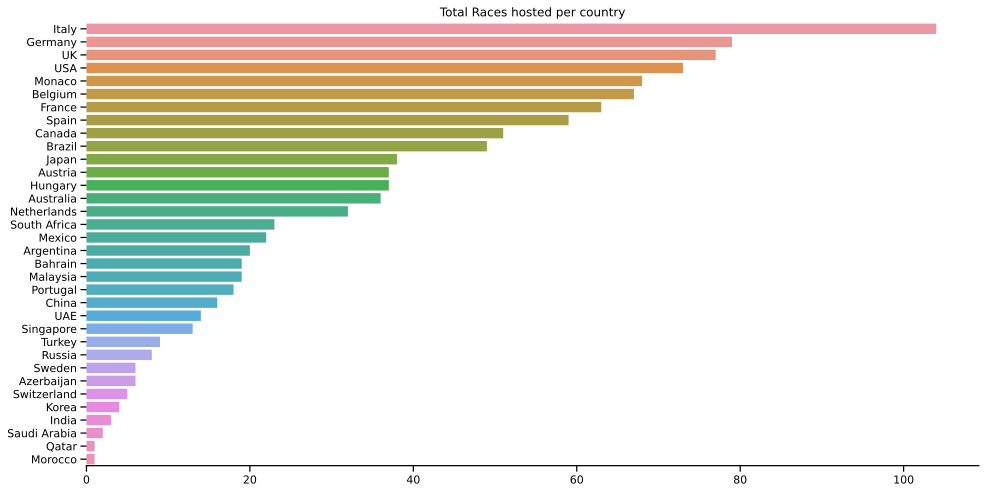

In [31]:
ax = sns.countplot(
    races_with_circuits,
    y="country",
    order=races_with_circuits["country"].value_counts(ascending=False).index,
).set(title=f"Total Races hosted per country", xlabel=None, ylabel=None)

sns.despine(left=True)


In [32]:
base_map_races = basemap[
    ["ADMIN", "CONTINENT", "REGION_UN", "SUBREGION", "REGION_WB", "geometry"]
]
races_per_country = (
    races_with_circuits["country"]
    .value_counts()
    .reset_index()
    .rename(columns={"country": "F1_races", "index": "cf1"})
)
base_map_races = base_map_races.merge(
    races_per_country, left_on="ADMIN", right_on="cf1", how="left"
).drop("cf1", axis=1)
base_map_races['F1_races'] = base_map_races['F1_races'].fillna(0)
base_map_races.head()


,ADMIN,CONTINENT,REGION_UN,SUBREGION,REGION_WB,geometry,F1_races
0,Zimbabwe,Africa,Africa,Eastern Africa,Sub-Saharan Africa,"POLYGON ((31.28789 -22.40205, 31.19727 -22.34492, 31.07344 -22.30781, 30.91611 -22.29072, 30.71162 -22.29785, 30.46016 -22.32900, 30.19043 -22.29111, 29.90234 -22.18418, 29.66309 -22.14629, 29.37744 -22.19277, 29.36484 -22.19395, 29.31523 -22.15771, 29.23721 -22.07949, 29.10684 -22.06572, 29.07148 -22.04746, 29.04238 -22.01836, 29.02334 -21.98125, 29.01582 -21.93994, 29.03730 -21.81133, 29.02559 -21.79688, 28.99072 -21.78145, 28.91934 -21.76602, 28.74775 -21.70762, 28.53203 -21.65127, 28.181...",0.0
1,Zambia,Africa,Africa,Eastern Africa,Sub-Saharan Africa,"POLYGON ((30.39609 -15.64307, 30.25068 -15.64346, 29.99492 -15.64404, 29.72959 -15.64463, 29.48730 -15.69678, 29.28789 -15.77646, 29.05059 -15.90117, 28.97305 -15.95010, 28.91309 -15.98779, 28.87559 -16.03613, 28.85674 -16.14229, 28.85674 -16.30615, 28.83271 -16.42412, 28.76055 -16.53213, 28.76064 -16.53193, 28.39980 -16.66279, 28.16377 -16.76973, 27.93223 -16.89619, 27.75654 -17.06035, 27.63672 -17.26211, 27.43789 -17.51191, 27.23574 -17.72832, 27.02080 -17.95840, 26.77988 -18.04150, 26.577...",0.0
2,Yemen,Asia,Asia,Western Asia,Middle East & North Africa,"MULTIPOLYGON (((53.08564 16.64839, 52.58145 16.47036, 52.44844 16.39126, 52.32773 16.29355, 52.23730 16.17139, 52.17402 15.95684, 52.22207 15.76060, 52.21748 15.65552, 52.08730 15.58594, 51.96582 15.53569, 51.83076 15.45928, 51.74863 15.44014, 51.68154 15.37910, 51.60371 15.33682, 51.32246 15.22627, 51.01514 15.14077, 50.52705 15.03818, 50.33857 14.92720, 50.16689 14.85103, 49.90635 14.82812, 49.54863 14.72241, 49.34990 14.63779, 49.10293 14.50005, 49.04805 14.45645, 49.00469 14.35503, 48.92...",0.0
3,Vietnam,Asia,Asia,South-Eastern Asia,East Asia & Pacific,"MULTIPOLYGON (((104.06396 10.39082, 104.08301 10.34111, 104.07578 10.22485, 104.03682 10.11074, 104.04834 10.06104, 104.01846 10.02920, 103.95215 10.24292, 103.86797 10.33540, 103.84951 10.37109, 103.89844 10.36851, 103.98584 10.42695, 104.02773 10.42837, 104.06396 10.39082)), ((107.97266 21.50796, 107.92578 21.49893, 107.80908 21.49712, 107.70723 21.40586, 107.63672 21.36807, 107.52695 21.33623, 107.40996 21.28481, 107.37617 21.19414, 107.37334 21.12847, 107.35430 21.05518, 107.16475 20.948...",0.0
4,Venezuela,South America,Americas,South America,Latin America & Caribbean,"MULTIPOLYGON (((-60.82119 9.13838, -60.94141 9.10557, -60.93945 9.13232, -60.90728 9.17871, -60.84487 9.19180, -60.82139 9.20767, -60.78159 9.21836, -60.75889 9.21646, -60.73584 9.20332, -60.79038 9.17720, -60.82119 9.13838)), ((-63.84937 11.13101, -63.81729 11.00034, -63.82710 10.97583, -63.91763 10.88755, -63.99355 10.88120, -64.05469 10.88433, -64.10117 10.90142, -64.16089 10.95879, -64.21895 10.94160, -64.36250 10.96152, -64.40234 10.98159, -64.34863 11.05190, -64.24976 11.08032, -64.213...",0.0


In [33]:
ax = base_map_races.plot(edgecolor="black", linewidth=0.2, color="white")
sns.scatterplot(races_with_circuits, x="lng", y="lat", s=100, ax=ax,edgecolors='black',lw=1)
ax.axis("off")


(-198.0, 198.0, -65.5968798828125, 90.7042041015625)

In [34]:
races_with_circuits['des_lat'] = races_with_circuits['lat'].shift(-1)
races_with_circuits['des_lng'] = races_with_circuits['lng'].shift(-1)
races_with_circuits.at[(len(races_with_circuits)-1),'des_lng'] = races_with_circuits.at[0,'lng']
races_with_circuits.at[(len(races_with_circuits)-1),'des_lat'] = races_with_circuits.at[0,'lat']
races_with_circuits

,raceId,year,round,circuitId,name,date,decade,name_circuit,location,country,lat,lng,alt,des_lat,des_lng
0,833,1950,1,9,British Grand Prix,1950-05-13,1950,Silverstone Circuit,Silverstone,UK,52.0786,-1.01694,153,43.7347,7.42056
1,834,1950,2,6,Monaco Grand Prix,1950-05-21,1950,Circuit de Monaco,Monte-Carlo,Monaco,43.7347,7.42056,7,39.7950,-86.23470
2,835,1950,3,19,Indianapolis 500,1950-05-30,1950,Indianapolis Motor Speedway,Indianapolis,USA,39.7950,-86.23470,223,46.9589,7.40194
3,836,1950,4,66,Swiss Grand Prix,1950-06-04,1950,Circuit Bremgarten,Bern,Switzerland,46.9589,7.40194,551,50.4372,5.97139
4,837,1950,5,13,Belgian Grand Prix,1950-06-18,1950,Circuit de Spa-Francorchamps,Spa,Belgium,50.4372,5.97139,401,49.2542,3.93083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1074,1092,2022,18,22,Japanese Grand Prix,2022-10-09,2020,Suzuka Circuit,Suzuka,Japan,34.8431,136.54100,45,30.1328,-97.64110
1075,1093,2022,19,69,United States Grand Prix,2022-10-23,2020,Circuit of the Americas,Austin,USA,30.1328,-97.64110,161,19.4042,-99.09070
1076,1094,2022,20,32,Mexico City Grand Prix,2022-10-30,2020,Autódromo Hermanos Rodríguez,Mexico City,Mexico,19.4042,-99.09070,2227,-23.7036,-46.69970
1077,1095,2022,21,18,Brazilian Grand Prix,2022-11-13,2020,Autódromo José Carlos Pace,São Paulo,Brazil,-23.7036,-46.69970,785,24.4672,54.60310


In [35]:
from shapely.geometry import LineString

geometry = races_with_circuits[["lat", "lng", "des_lat", "des_lng"]].apply(
    lambda x: LineString(
        [[x["lng"], x["lat"]], [x["des_lng"], x["des_lat"]]]
    ),
    axis=1,
)

races_with_circuits_gdf = gpd.GeoDataFrame(races_with_circuits, geometry=geometry, crs='EPSG:4326')
races_with_circuits_gdf


,raceId,year,round,circuitId,name,date,decade,name_circuit,location,country,lat,lng,alt,des_lat,des_lng,geometry
0,833,1950,1,9,British Grand Prix,1950-05-13,1950,Silverstone Circuit,Silverstone,UK,52.0786,-1.01694,153,43.7347,7.42056,"LINESTRING (-1.01694 52.07860, 7.42056 43.73470)"
1,834,1950,2,6,Monaco Grand Prix,1950-05-21,1950,Circuit de Monaco,Monte-Carlo,Monaco,43.7347,7.42056,7,39.7950,-86.23470,"LINESTRING (7.42056 43.73470, -86.23470 39.79500)"
2,835,1950,3,19,Indianapolis 500,1950-05-30,1950,Indianapolis Motor Speedway,Indianapolis,USA,39.7950,-86.23470,223,46.9589,7.40194,"LINESTRING (-86.23470 39.79500, 7.40194 46.95890)"
3,836,1950,4,66,Swiss Grand Prix,1950-06-04,1950,Circuit Bremgarten,Bern,Switzerland,46.9589,7.40194,551,50.4372,5.97139,"LINESTRING (7.40194 46.95890, 5.97139 50.43720)"
4,837,1950,5,13,Belgian Grand Prix,1950-06-18,1950,Circuit de Spa-Francorchamps,Spa,Belgium,50.4372,5.97139,401,49.2542,3.93083,"LINESTRING (5.97139 50.43720, 3.93083 49.25420)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1074,1092,2022,18,22,Japanese Grand Prix,2022-10-09,2020,Suzuka Circuit,Suzuka,Japan,34.8431,136.54100,45,30.1328,-97.64110,"LINESTRING (136.54100 34.84310, -97.64110 30.13280)"
1075,1093,2022,19,69,United States Grand Prix,2022-10-23,2020,Circuit of the Americas,Austin,USA,30.1328,-97.64110,161,19.4042,-99.09070,"LINESTRING (-97.64110 30.13280, -99.09070 19.40420)"
1076,1094,2022,20,32,Mexico City Grand Prix,2022-10-30,2020,Autódromo Hermanos Rodríguez,Mexico City,Mexico,19.4042,-99.09070,2227,-23.7036,-46.69970,"LINESTRING (-99.09070 19.40420, -46.69970 -23.70360)"
1077,1095,2022,21,18,Brazilian Grand Prix,2022-11-13,2020,Autódromo José Carlos Pace,São Paulo,Brazil,-23.7036,-46.69970,785,24.4672,54.60310,"LINESTRING (-46.69970 -23.70360, 54.60310 24.46720)"


In [36]:
import cartopy.crs as ccrs

fig = plt.figure(figsize=(16, 8), facecolor="black")
ax = plt.axes(projection=ccrs.Robinson())
ax.patch.set_facecolor("black")

races_with_circuits_gdf.plot(
    ax=ax, transform=ccrs.Geodetic(), color="Red", linewidth=0.1, alpha=0.5
)
# sns.scatterplot(races_with_circuits, x="lng", y="lat", s=25, ax=ax,color='Red',lw=1)

basemap.plot(
    ax=ax, transform=ccrs.Geodetic(), color="black", edgecolor="white", linewidth=0.2
)

plt.setp(ax.spines.values(), color="black")
# plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='black')

ax.set_ylim(-7000000, 8800000)
plt.show()


In [37]:
from scipy.special import binom
def Bernstein(n, k):
    """Bernstein polynomial.
    """
    coeff = binom(n, k)

    def _bpoly(x):
        return coeff * x ** k * (1 - x) ** (n - k)

    return _bpoly

def Bezier(points,start,end,num=10):
    """Build Bezier curve from points.
    """
    N = len(points)
    t = np.linspace(start, end, num)
    curve = np.zeros((num, 2))
    for ii in range(N):
        curve += np.outer(Bernstein(N - 1, ii)(t), points[ii])
        
    return curve

def Bezier_control(pointA,pointB,height):
    """ 
    Given a line defined by 2 points A & B, 
    find a third point at a given distance that defines a line perpendicular to line AB which intercepts AB at its midpoint.
    Equation derived by Luiz Max Fagundes de Carvalho (University of Edinburgh).
    """
    if(pointA==pointB): return pointA

    x1,y1=pointA
    x2,y2=pointB
        
    sign=1
    if x1>x2:
        sign=-1

    slope = (y2-y1) / (x2-x1)
    d=np.sqrt((y2-y1)**2 + (x2-x1)**2)
    
        
    h=np.sqrt(height**2+(d**2)/4.0)
    
    n1=x1+h*np.cos(np.arctan(2*height/float(d))+np.arctan(slope))*sign
    n2=y1+h*np.sin(np.arctan(2*height/float(d))+np.arctan(slope))*sign

    return (n1,n2)

In [38]:
bezier_line

NameError: name 'bezier_line' is not defined

# Animation

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
InteractiveShell.ast_node_interactivity = 'last_expr'

In [41]:
def get_distance(pointA,pointB):
    return np.sqrt(np.square(pointA[0]-pointB[0]) + np.square(pointA[1]-pointB[1]))


In [42]:
pointA = (-1.01694,52.0786)
pointB = (7.42056,43.7347)
distance = get_distance(pointA,pointB)
adjust_d=-1*(float(distance)**0.5)
# adjust_d=-1+0.1/float(distance)**0.15+1
float(distance)**0.15+1
adjust_d

-3.444767962252958

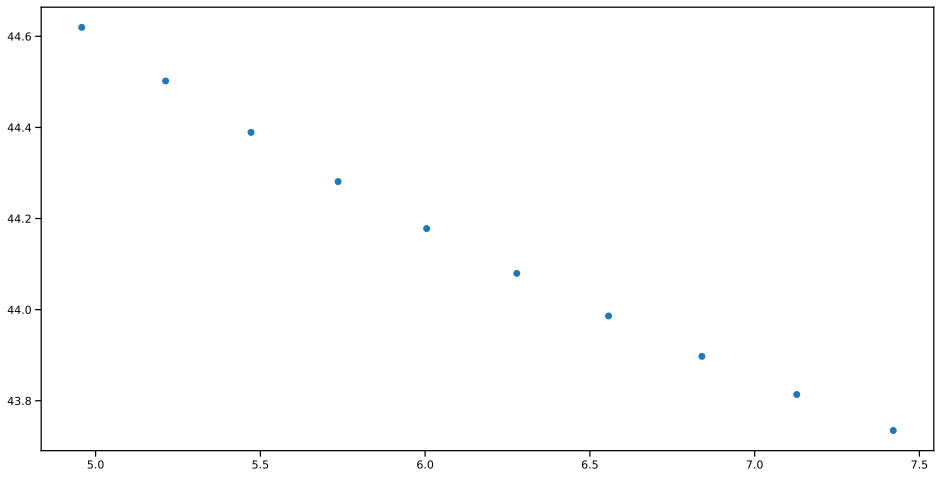

In [46]:
bez_control = Bezier_control(pointA,pointB,adjust_d)
bezier_line = Bezier([pointA,bez_control,pointB],0.8,1.0, 10)
bez_control

plt.scatter(bezier_line[:,0], bezier_line[:,1])
plt.show()

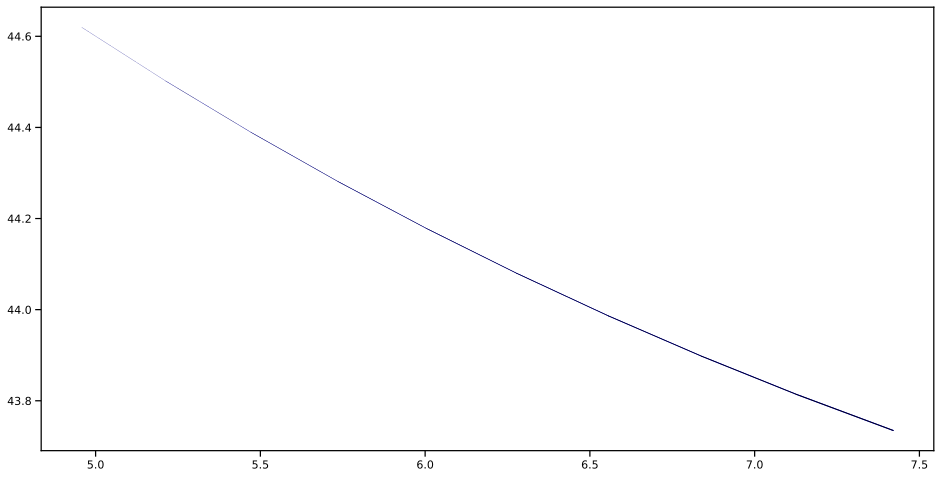

In [47]:
fig, ax =plt.subplots()
for q in range(len(bezier_line)-1):
    x1,y1=bezier_line[q]
    x2,y2=bezier_line[q+1]

    ## fraction along length of Bezier line
    segL=(q+1)/float(len(bezier_line))

    ## plot actual lineage
    ax.plot([x1,x2],[y1,y2],lw=1*segL,alpha=1,color='k',zorder=99,solid_capstyle='round')

    ## plot underlying white background to help lineages stand out
    ax.plot([x1,x2],[y1,y2],lw=1.2*segL,alpha=1,color='b',zorder=98,solid_capstyle='round')
plt.show()

In [ ]:
races_with_circuits_gdf.head()

,raceId,year,round,circuitId,name,date,decade,name_circuit,location,country,lat,lng,alt,des_lat,des_lng,geometry
0,833,1950,1,9,British Grand Prix,1950-05-13,1950,Silverstone Circuit,Silverstone,UK,52.0786,-1.01694,153,43.7347,7.42056,"LINESTRING (-1.01694 52.07860, 7.42056 43.73470)"
1,834,1950,2,6,Monaco Grand Prix,1950-05-21,1950,Circuit de Monaco,Monte-Carlo,Monaco,43.7347,7.42056,7,39.7950,-86.23470,"LINESTRING (7.42056 43.73470, -86.23470 39.79500)"
2,835,1950,3,19,Indianapolis 500,1950-05-30,1950,Indianapolis Motor Speedway,Indianapolis,USA,39.7950,-86.23470,223,46.9589,7.40194,"LINESTRING (-86.23470 39.79500, 7.40194 46.95890)"
3,836,1950,4,66,Swiss Grand Prix,1950-06-04,1950,Circuit Bremgarten,Bern,Switzerland,46.9589,7.40194,551,50.4372,5.97139,"LINESTRING (7.40194 46.95890, 5.97139 50.43720)"
4,837,1950,5,13,Belgian Grand Prix,1950-06-18,1950,Circuit de Spa-Francorchamps,Spa,Belgium,50.4372,5.97139,401,49.2542,3.93083,"LINESTRING (5.97139 50.43720, 3.93083 49.25420)"


In [ ]:
# fig, ax = plt.subplots(figsize=(6,6))
# def animate(frame):
#     x1 = frame['lng']
#     x2 = frame['des_lng']
#     y1 = frame['lat']
#     y2 = frame['des_lat']
#     distance = get_distance((x1,y1), (x2,y2))
#     adjust_d=-1+0.1/float(distance)**0.15+0.5
#     bez_control = Bezier_control((x1,y1), (x2,y2), adjust_d)
#     bezier_line = Bezier([(x1,y1), bez_control, (x2,y2)],0.0,1.0,num=15)

#     for q in range(len(bezier_line)-1):
#         x1,y1=bezier_line[q]
#         x2,y2=bezier_line[q+1]

#         ## fraction along length of Bezier line
#         segL=(q+1)/float(len(bezier_line))

#         ## plot actual lineage
#         ax.plot([x1,x2],[y1,y2],lw=7*segL,alpha=1,color='k',zorder=99,solid_capstyle='round')

#         ## plot underlying white background to help lineages stand out
#         ax.plot([x1,x2],[y1,y2],lw=9*segL,alpha=1,color='w',zorder=98,solid_capstyle='round')



In [48]:
import time


t0 = time.time()
fig, ax = plt.subplots(figsize=(20,20), facecolor='k')
ax.patch.set_facecolor("black")
def animate(a):
    frame = races_with_circuits.loc[races_with_circuits['raceId']==a]
    x1 = frame['lng'].values[0]
    y1 = frame['lat'].values[0]
    x2 = frame['des_lng'].values[0]
    y2 = frame['des_lat'].values[0]
    # print((x1,y1),(x2,y2))
    distance = get_distance((x1,y1), (x2,y2))
    if distance == 0: 
        distance = 1
        return

    adjust_d=-1*(float(distance)**0.5)
    bez_control = Bezier_control((x1,y1), (x2,y2), adjust_d)
    bezier_line = Bezier([(x1,y1), bez_control, (x2,y2)],0.8,1.0,num=25)

    for q in range(len(bezier_line)-1):
        x1,y1=bezier_line[q]
        x2,y2=bezier_line[q+1]

        ## fraction along length of Bezier line
        segL=(q+1)/float(len(bezier_line))

        ## plot actual lineage
        ax.plot([x1,x2],[y1,y2],lw=0.8*segL,color='w',zorder=99,solid_capstyle='round', alpha=0.4)

        ## plot underlying white background to help lineages stand out
        ax.plot([x1,x2],[y1,y2],lw=1*segL,alpha=0.5,color='r',zorder=98,solid_capstyle='round')

# plt.clf() 
# plt.cla()

basemap.plot(
    ax=ax,  color="k", edgecolor="w", linewidth=0.2
)
for i, a in enumerate(races_with_circuits['raceId'].head(10)):
    # print(i)
    # print(races_with_circuits.loc[races_with_circuits['raceId']==a]['des_lat'])
    animate(a)
    # plt.savefig(f'output/f1_globe_animation/ani_frame_{i}.png', dpi=50, bbox_inches='tight', format='png')

plt.show()
print(f'{time.time()-t0}')

1.3952715396881104


In [ ]:
races_with_circuits_gdf.iloc[0]['year']

1950

In [ ]:
import time

In [ ]:

for i in range(10):
    print(i)
# print(f'{timeit()}')

0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
0
1
2
3
4
5
6
7
8
9
